In [24]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [32]:
folder_task = '/home/xingguang/Documents/ECE661/hw3/hw3_Task1_Images/Images'
path_1 = os.path.join(folder_task, '1.jpeg')
path_2 = os.path.join(folder_task, '2.jpeg')
path_3 = os.path.join(folder_task, '3.jpeg')
outpath_1 = os.path.join(folder_task, 'twostep1.jpeg')
outpath_2 = os.path.join(folder_task, 'twostep2.jpeg')
outpath_3 = os.path.join(folder_task, 'twostep3.jpeg')
outpathproj_1 = os.path.join(folder_task, 'twostepproj1.jpeg')
outpathproj_2 = os.path.join(folder_task, 'twostepproj2.jpeg')
outpathproj_3 = os.path.join(folder_task, 'twostepproj3.jpeg')
img_1 = cv2.cvtColor(cv2.imread(path_1), cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(cv2.imread(path_2), cv2.COLOR_BGR2RGB)
img_3 = cv2.cvtColor(cv2.imread(path_3), cv2.COLOR_BGR2RGB)

In [26]:
def choosePQRS(img=1):
    if img == 1:
        P = [472, 118]
        Q = [449, 562]
        S = [1406, 448]
        R = [1447, 715]

        P_ = [705, 346]
        Q_ = [705, 376]
        S_ = [726, 353]
        R_ = [725, 383]


    if img == 2:
        P = [382, 576]
        Q = [379, 834]
        S = [593, 551]
        R = [606, 922]

        P_ = [427, 118]
        Q_ = [425, 346]
        S_ = [511, 40]
        R_ = [514, 298]

    if img == 3:
        P = [2062, 698] #2nd
        Q = [2096, 1479]
        S = [2668, 717]
        R = [2694, 1333]

        P_ = [2089, 738]
        Q_ = [2115, 1434]
        S_ = [2652, 749]
        R_ = [2674, 1301]
    return np.asarray([P, Q, S, R]), np.asarray([P_, Q_, S_, R_])

def definePQRS(width, height):
    P = [0, 0]
    Q = [0, height]
    S = [width, 0]
    R = [width, height]
    return np.asarray([P, Q, S, R])

range_1, aff_1 = choosePQRS(1)
range_2, aff_2 = choosePQRS(2)
range_3, aff_3 = choosePQRS(3)

In [27]:
def findHomoproj(source, target):
    def F_unit(source_point, target_point):
        x, y = source_point[0], source_point[1]
        x_, y_ = target_point[0], target_point[1]
        return np.asarray([[x, y, 1, 0, 0, 0, -x*x_, -y*x_], 
                        [0, 0, 0, x, y, 1, -x*y_, -y*y_]])
    F_list = [F_unit(source[i], target[i]) for i in range(4)]
    F = np.concatenate(F_list, axis=0)
    T_span = target.reshape((-1,1))
    H_param = np.matmul(np.linalg.inv(F), T_span)
    H = np.ones((9, 1))
    H[:8, :] = H_param
    return H.reshape((3, 3))

def newHomography(H, r, width, height):
    expanded = projTransform(H, r)
    l, r = np.amin(expanded[:, 0]), np.amax(expanded[:, 0])
    t, b = np.amin(expanded[:, 1]), np.amax(expanded[:, 1])
    s_1 = (r - l) / width
    s_2 = (b - t) / height
    H_new = np.asarray([[s_1, 0, -l], [0, s_2, -t], [0, 0, 1]])
    return np.matmul(np.linalg.inv(H), H_new)

In [28]:
def findProjTrans(PQSR):
    PQSR = np.concatenate((PQSR, np.ones((4,1))), axis=1)
    pq = np.cross(PQSR[0], PQSR[1])
    sr = np.cross(PQSR[2], PQSR[3])
    ps = np.cross(PQSR[0], PQSR[2])
    qr = np.cross(PQSR[1], PQSR[3])
    point_1 = np.cross(pq, sr)
    point_2 = np.cross(ps, qr)
    point_1 = point_1/point_1[-1]
    point_2 = point_2/point_2[-1]
    VL = np.cross(point_1, point_2)
    H = np.identity(3)
    H[-1,:] = VL/VL[-1]
    return H


def findAffineTrans(PQSR):
    PQSR = np.concatenate((PQSR, np.ones((4,1))), axis=1)
    pq = np.cross(PQSR[0], PQSR[1])
    sr = np.cross(PQSR[2], PQSR[3])
    ps = np.cross(PQSR[0], PQSR[2])
    qr = np.cross(PQSR[1], PQSR[3])

    pq = pq/pq[-1]
    sr = sr/sr[-1]
    ps = ps/ps[-1]
    qr = qr/qr[-1]
    LM_1 = np.matmul(pq[np.newaxis,:].T, ps[np.newaxis,:])
    LM_2 = np.matmul(sr[np.newaxis,:].T, qr[np.newaxis,:])
    A = np.asarray([[LM_1[0,0], LM_1[0,1]+LM_1[1,0]], [LM_2[0,0], LM_2[0,1]+LM_2[1,0]]])
    C = np.asarray([[LM_1[1,1]], [LM_2[1,1]]])
    s_ = np.matmul(np.linalg.pinv(A), -C).squeeze()
    S = np.asarray([[s_[0],s_[1]], [s_[1], 1]])

    _, D, VT = np.linalg.svd(S, full_matrices=True)
    d = np.asarray([[np.sqrt(D[0]), 0], [0, np.sqrt(D[1])]])
    H = np.identity(3)
    H[0:2,0:2] = np.matmul(np.matmul(VT.T,d), VT)
    return H

In [29]:
def projTransform(H, source):
    nps = source.shape[0]
    source_rep = np.concatenate((source, np.ones((nps,1))), axis=1)
    t_homo = np.matmul(H, source_rep.T).T
    t_norm = t_homo / t_homo[:,2].reshape((nps,1))
    return t_norm[:,:2]

In [30]:
def projRange(source, H):
    out = np.zeros_like(source)
    height, width, _ = source.shape
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            coor_source = np.asarray([[j, i]])
            coor_target = projTransform(H, coor_source).squeeze()
            h, w = int(coor_target[1]), int(coor_target[0])
            if 0 <= h < height and 0 <= w <width:
                out[i,j,:] = source[h, w,:]
    return out

def resizeParam(H, r, source):
    expanded = projTransform(H, r)
    l, r = np.amin(expanded[:, 0]), np.amax(expanded[:, 0])
    t, b = np.amin(expanded[:, 1]), np.amax(expanded[:, 1])
    s_1 = (r - l) / source.shape[1]
    s_2 = (b - t) / source.shape[0]

    s = s_1 if s_1>s_2 else s_2
    return s, l, t

def projResizeRange(source, H, limit):
    r = definePQRS(source.shape[1], source.shape[0])
    expanded = projTransform(H, r)
    l, r = np.amin(expanded[:, 0]), np.amax(expanded[:, 0])
    t, b = np.amin(expanded[:, 1]), np.amax(expanded[:, 1])
    # s_1 = (r - l) / source.shape[1]
    # s_2 = (b - t) / source.shape[0]

    # s = s_1 if s_1>s_2 else s_2

    height, width = (b-t), (r-l)
    if height > limit or width > limit:
        s_r = limit / height if height>width else limit/width
    else:
        s_r = 1
    H = np.linalg.inv(H)
    out = np.zeros((int((b-t)*s_r), int((r-l)*s_r), 3), dtype=source.dtype)
    print("Size of undistorted image is:", out.shape)
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            coor_source = np.asarray([[j/s_r+l, i/s_r+t]])
            coor_target = projTransform(H, coor_source).squeeze()
            h, w = int(coor_target[1]), int(coor_target[0])
            if 0 <= h < source.shape[0] and 0 <= w <source.shape[1]:
                out[i,j,:] = source[h, w,:]
    return out

Size of undistorted image is: (1377, 3000, 3)


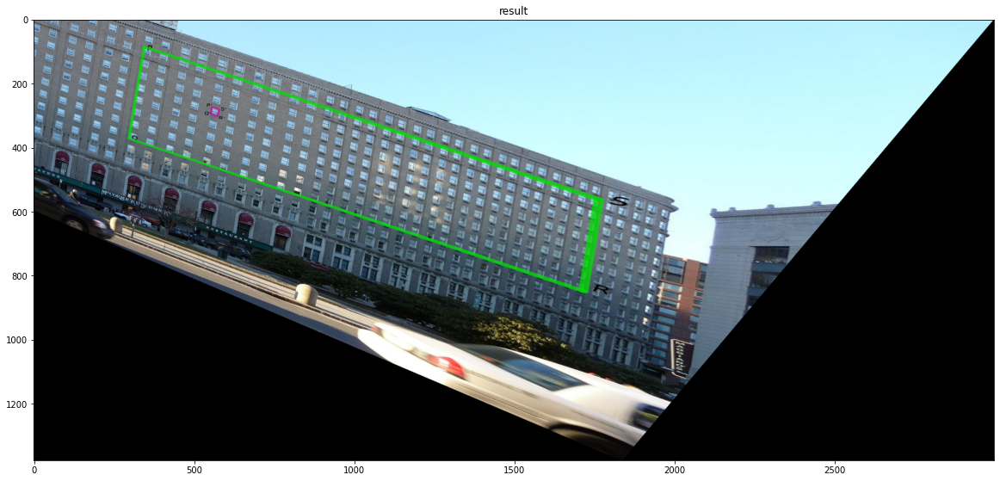

In [31]:
H_proj = findProjTrans(range_1)
result = projResizeRange(img_1, H_proj, 3000)
cv2.imwrite(outpathproj_1, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (2133, 3000, 3)


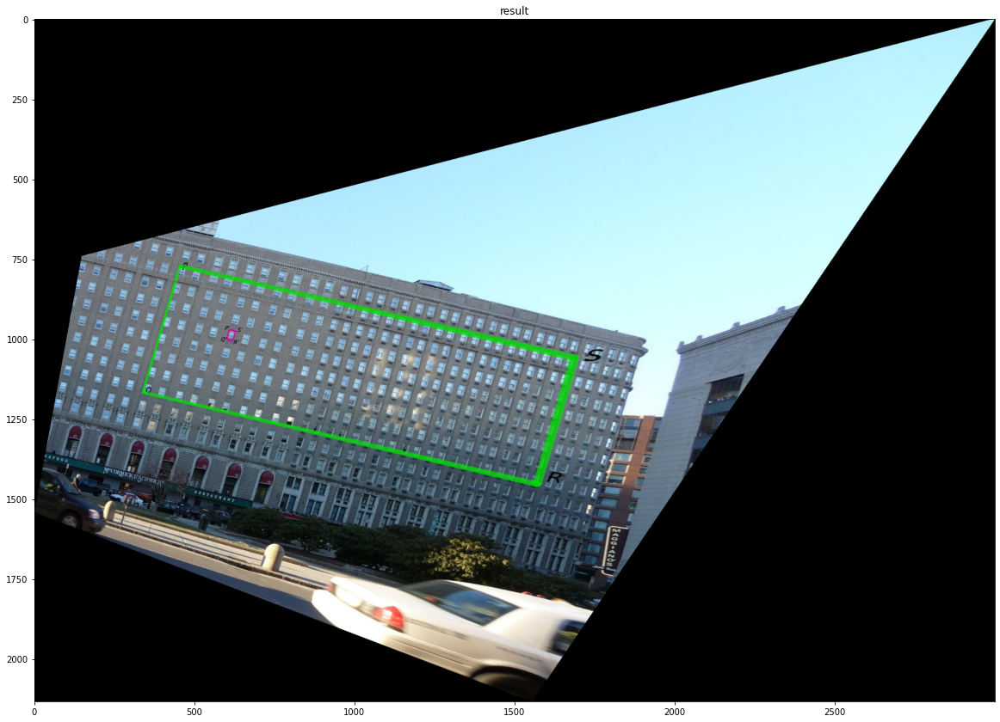

In [16]:
H_proj = findProjTrans(range_1)
Noproj = projTransform(H_proj, aff_1)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_1, H, 3000)
cv2.imwrite(outpath_1, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (486, 1702, 3)


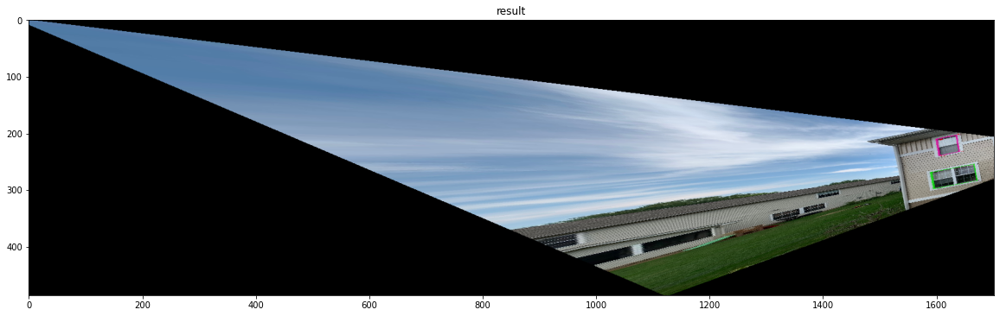

In [17]:
H_proj = findProjTrans(aff_2)
Noproj = projTransform(H_proj, range_2)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_2, H, 3000)
cv2.imwrite(outpath_2, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (1513, 3000, 3)


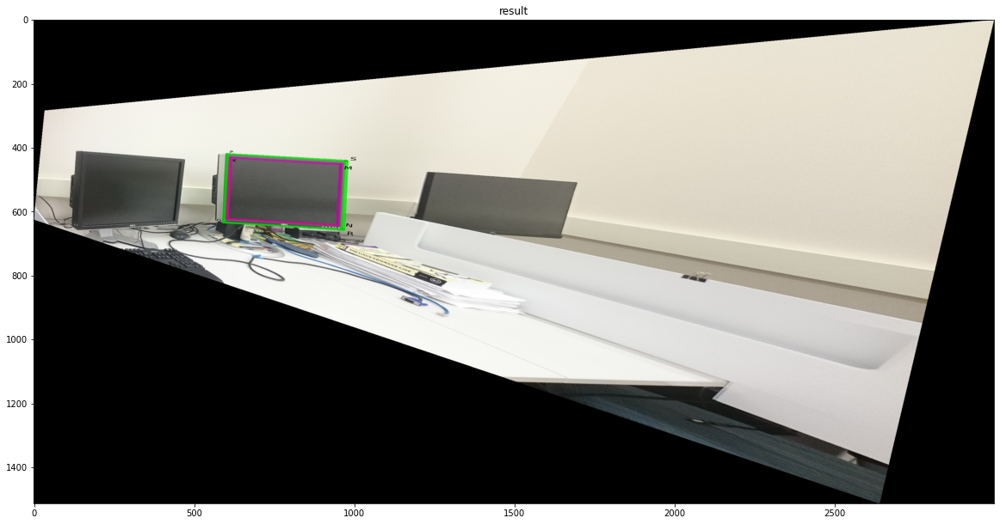

In [18]:
H_proj = findProjTrans(range_3)
Noproj = projTransform(H_proj, aff_3)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_3, H, 3000)
cv2.imwrite(outpath_3, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

In [19]:
folder_task = '/home/xingguang/Documents/ECE661/hw3/hw3_Task2_Images/Images'
path_1 = os.path.join(folder_task, '1.jpeg')
path_2 = os.path.join(folder_task, '2.jpeg')
path_3 = os.path.join(folder_task, '3.jpeg')
outpath_1 = os.path.join(folder_task, 'twostep1.jpeg')
outpath_2 = os.path.join(folder_task, 'twostep2.jpeg')
outpath_3 = os.path.join(folder_task, 'twostep3.jpeg')

img_1 = cv2.cvtColor(cv2.imread(path_1), cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(cv2.imread(path_2), cv2.COLOR_BGR2RGB)
img_3 = cv2.cvtColor(cv2.imread(path_3), cv2.COLOR_BGR2RGB)

In [20]:
def choosePQRS(img=1):
    if img == 1:
        P = [2101, 493]
        Q = [2075, 1473]
        S = [2637, 652]
        R = [2661, 1556]

        P_ = [2202, 919]
        Q_ = [2200, 1017]
        S_ = [2613, 1014]
        R_ = [2615, 1107]

    if img == 2:
        P = [1128, 883]
        Q = [945, 2027]
        S = [2180, 1308]
        R = [2129, 2195]

        P_ = [843, 736]
        Q_ = [792, 1007]
        S_ = [3127, 1672]
        R_ = [3131, 1826]

    if img == 3:
        P = [495, 232] 
        Q = [453, 3189]
        S = [2406, 309]
        R = [2263, 3245]

        P_ = [631, 2846]
        Q_ = [625, 3127]
        S_ = [2131, 2891]
        R_ = [2120, 3174]
    return np.asarray([P, Q, S, R]), np.asarray([P_, Q_, S_, R_])

def definePQRS(width, height):
    P = [0, 0]
    Q = [0, height]
    S = [width, 0]
    R = [width, height]
    return np.asarray([P, Q, S, R])

range_1, aff_1 = choosePQRS(1)
range_2, aff_2 = choosePQRS(2)
range_3, aff_3 = choosePQRS(3)

Size of undistorted image is: (2284, 3000, 3)


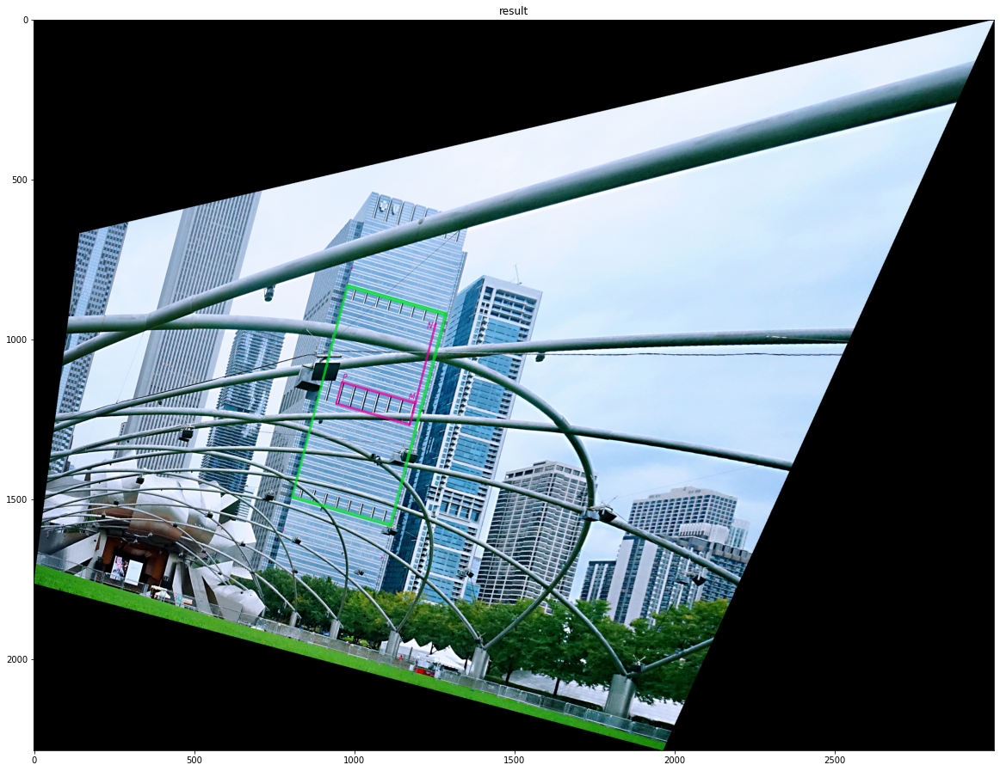

In [21]:
H_proj = findProjTrans(range_1)
Noproj = projTransform(H_proj, aff_1)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_1, H, 3000)
cv2.imwrite(outpath_1, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (3000, 2922, 3)


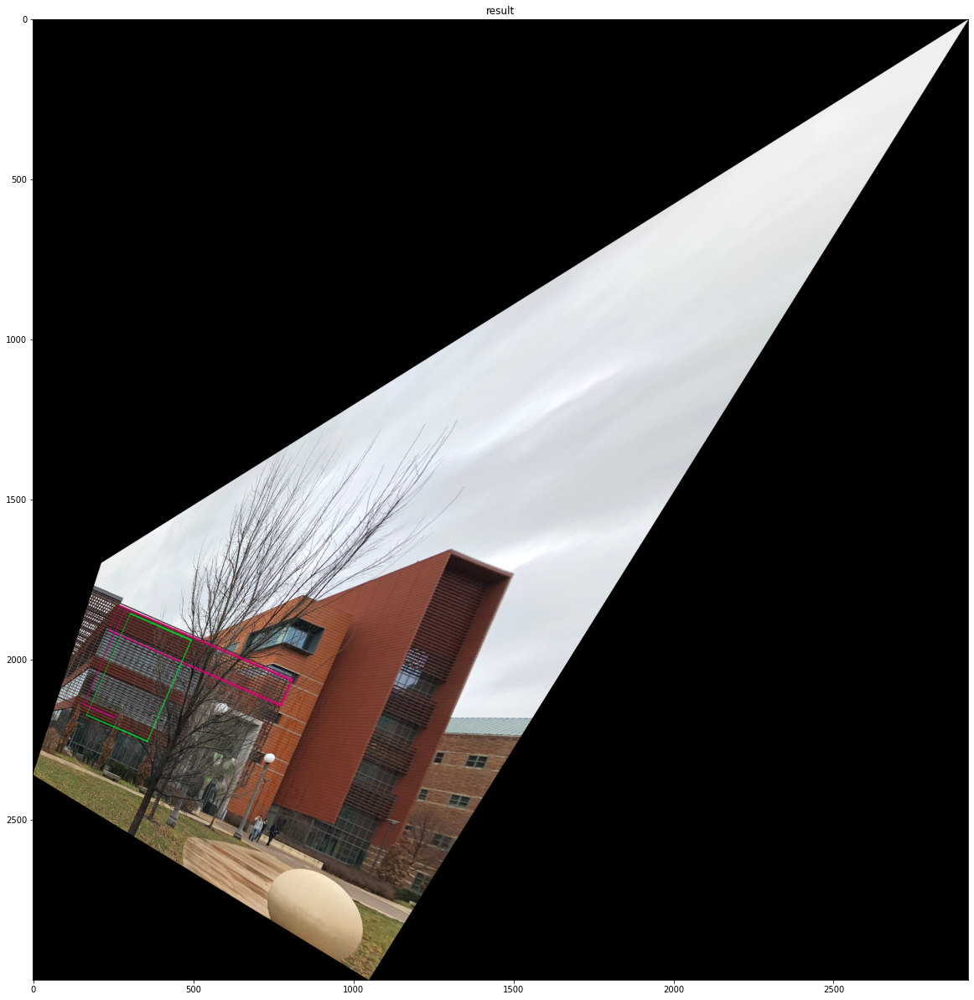

In [22]:
H_proj = findProjTrans(range_2)
Noproj = projTransform(H_proj, aff_2)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_2, H, 3000)
cv2.imwrite(outpath_2, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (3000, 1089, 3)


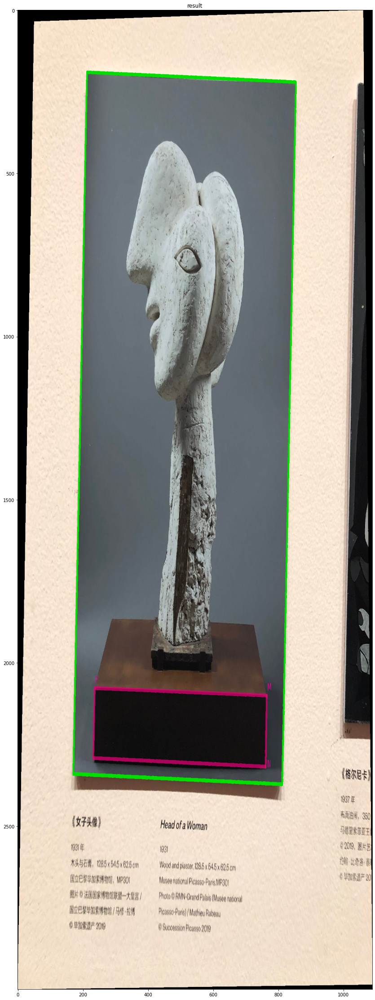

In [23]:
H_proj = findProjTrans(range_3)
Noproj = projTransform(H_proj, aff_3)
H_aff = findAffineTrans(Noproj)
H = np.matmul(np.linalg.inv(H_aff), H_proj)

result = projResizeRange(img_3, H, 3000)
cv2.imwrite(outpath_3, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)